In [1]:
import numpy as np
import copy
from utils.preprocessing_cleaned_data import *
from utils.swSets import *
from sklearn import naive_bayes, svm
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from scipy.sparse import vstack

# Recommandation avec SVM

<b>Idée :</b> 
- Entrainer le classifieur d'épisodes sur un ensemble de séries.  
- Prendre une série hors de cet ensemble.
- Tenter de classifier ses épisodes dans les séries aprises par le classifieur.
- Renvoyer la série apparaissant le plus dans les classifications comme étant la plus proche.

In [2]:
path = "/Vrac/PLDAC_reco/cleaned_data_reco_bayes"

corpus = get_corpus(path, texts_as="episodes")

In [3]:
d_info, d_name = getDicts(path)
d_name

{1: '108___Mad_Men',
 2: '10___Smallville',
 3: '1149___Downton_Abbey',
 4: '119___Robin_Hood',
 5: '121___Gossip_Girl',
 6: '122___Malcolm_In_The_Middle',
 7: '12___Doctor_Who',
 8: '132___NCIS',
 9: '152___Star_Trek__The_Animated_Series',
 10: '15___House',
 11: '16___Desperate_Housewives',
 12: '182___Friends',
 13: '186___American_Dad',
 14: '1___Lost',
 15: '2381___Scandal',
 16: '240___Breaking_Bad',
 17: '24___Scrubs',
 18: '262___Only_Fools_and_Horses',
 19: '2766___Major_Crimes',
 20: '28___Bones',
 21: '2964___Vikings',
 22: '2___Heroes',
 23: '30___Grey_s_Anatomy',
 24: '3103___House_of_Cards_(2013)',
 25: '32___Veronica_Mars',
 26: '334___Buffy_The_Vampire_Slayer',
 27: '364___Legend_of_the_Seeker',
 28: '366___True_Blood',
 29: '376___The_Mentalist',
 30: '384___H2O__Just_Add_Water',
 31: '3861___Orange_is_the_New_Black',
 32: '3990___Peaky_Blinders',
 33: '406___Agatha_Christie__Poirot',
 34: '4679___Outlander',
 35: '46___The_Tudors',
 36: '48___Everybody_Hates_Chris',
 

In [4]:
X = getTfidfSparseMat(corpus, my_stopwords = stopwords_set)

In [5]:
nb_eps = 0
for i in range(50, 58):
    nb_eps += sum(list(d_info[i].values()))
X1 = X[:-nb_eps]
X2 = X[-nb_eps:]

In [6]:
#Labelisation
for i in range(50, 58):
    del d_info[i]
nb_eps_per_show = []
for i in range(1, len(d_info.keys())+1):
    nb_eps_per_show.append(sum(d_info[i].values()))
Y = []
nb_shows = len(nb_eps_per_show)
somme_cumul = np.cumsum(nb_eps_per_show)
indMin = 0
for i in range(0, nb_shows):
    indMax = somme_cumul[i]
    for j in range(indMin, indMax):
        Y.append(i+1)
    indMin = indMax

In [7]:
# Linear SVM
lsvm_clf = svm.LinearSVC()
lsvm_clf.fit(X1, Y)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)

In [8]:
predictions = lsvm_clf.predict(X2)

In [10]:
d_info, d_name = getDicts(path)
cpt = 0
pred_series = []
for idSerie in range(50, 58) :
    dico_saisons = d_info[idSerie]
    pred_saisons = []
    for idSaison in dico_saisons :
        nb_ep = dico_saisons[idSaison]
        for idSerieReco in predictions[cpt:cpt+nb_ep]:
            pred_saisons.append(idSerieReco)
        
        cpt += nb_ep
    pred_series.append(pred_saisons)

In [11]:
import operator

l = []
for idSerie in range(0, len(pred_series)) :
    liste_series_recommandees = pred_series[idSerie]
    dico_series = dict.fromkeys(set(liste_series_recommandees), 0)
    for idSerieReco in liste_series_recommandees :
        dico_series[idSerieReco] += 1
    m = max(dico_series.items(), key=operator.itemgetter(1))[0]
    l.append(m)

l

[48, 43, 31, 40, 7, 7, 11, 12]

In [12]:
for idSerie in range(50, 58) :
    print("-----------------------------------------------------------------------\n")
    nomSerie = d_name[idSerie]
    print("Si vous avez aimé la série "+str(nomSerie)+"\n")
    idSerieReco = l[idSerie-50]
    nomSerieReco = d_name[idSerieReco]
    print("\tvous aimerez sûrement la série "+str(nomSerieReco)+"\n")

-----------------------------------------------------------------------

Si vous avez aimé la série 68___Black_Books

	vous aimerez sûrement la série 630___The_Nanny

-----------------------------------------------------------------------

Si vous avez aimé la série 6___Dexter

	vous aimerez sûrement la série 57___CSI__Crime_Scene_Investigation

-----------------------------------------------------------------------

Si vous avez aimé la série 71___The_Wire

	vous aimerez sûrement la série 3861___Orange_is_the_New_Black

-----------------------------------------------------------------------

Si vous avez aimé la série 73___Rome

	vous aimerez sûrement la série 54___Seinfeld

-----------------------------------------------------------------------

Si vous avez aimé la série 793___The_League_of_Gentlemen

	vous aimerez sûrement la série 12___Doctor_Who

-----------------------------------------------------------------------

Si vous avez aimé la série 79___The_Office_(UK)

	vous aimerez

La recommandation ne semble pas trop mauvaise.   

Fait amusant : on remarque que pour les séries anglaises, on recommande aussi des séries anglaises. Vocabulaire typiquement britanique présent dans les deux séries ?

*Black Books* & The *Nanny* : personnage nommé Fran dans les deux séries. Le ton des deux séries semble assez proche mais on ne souhaite pas recommander une série parce qu'elle a un personnage portant le même prénom que celui d'une autre série. --> On veut extraire les entités nommées.

# Mots avec les plus grands TF-IDF pour chaque série

In [13]:
path = "/Vrac/PLDAC_reco/cleaned_data_reco_bayes"

d_info, d_name = getDicts(path)

In [14]:
corpus = get_corpus(path, texts_as="shows")
X, df = getTfidfSparseMatAndDataFrame(corpus, my_stopwords=stopwords_set)

In [ ]:
#(X[0,:].A[0]).argmax()

In [15]:
nlargest = 20
order = np.argsort(-df.values, axis=1)[:, :nlargest]
result = pd.DataFrame(df.columns[order], 
                      columns=['top{}'.format(i) for i in range(1, nlargest+1)],
                      index=df.index)
result.head()

,top1,top2,top3,top4,top5,top6,top7,top8,top9,top10,top11,top12,top13,top14,top15,top16,top17,top18,top19,top20
0,draper,look,time,tell,peggy,sorry,people,thank,love,hello,little,home,day,talk,told,office,feel,night,mean,sterling
1,clark,lana,lex,chloe,lois,smallville,luthor,time,look,kent,tell,metropolis,luthorcorp,people,help,kal,dad,life,sorry,lionel
2,carson,lady,downton,bates,grantham,crawley,molesley,patmore,ladyship,sybil,mary,thank,time,tell,lord,hughes,edith,course,lordship,barrow
3,gisborne,robin,marian,sheriff,nottingham,hood,locksley,djaq,john,king,allan,time,kill,tell,people,look,help,nightwatchman,guy,isabella
4,serena,blair,chuck,nate,dan,tell,sorry,humphrey,time,look,mean,girl,dorota,love,lily,jenny,rufus,gossip,thank,maybe


108___Mad_Men


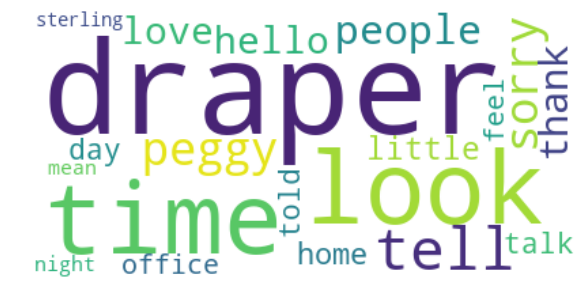

10___Smallville


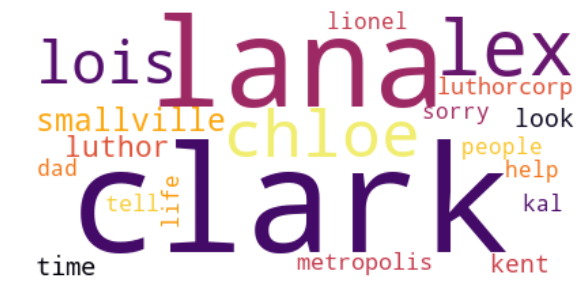

1149___Downton_Abbey


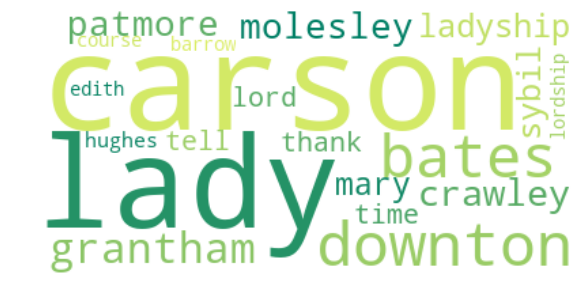

119___Robin_Hood


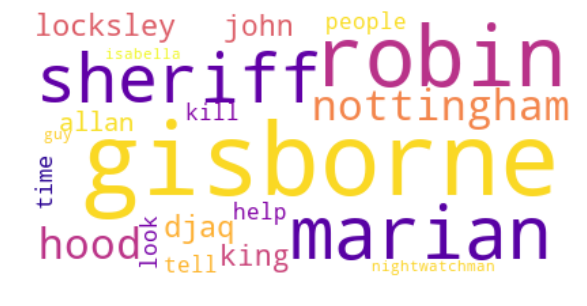

121___Gossip_Girl


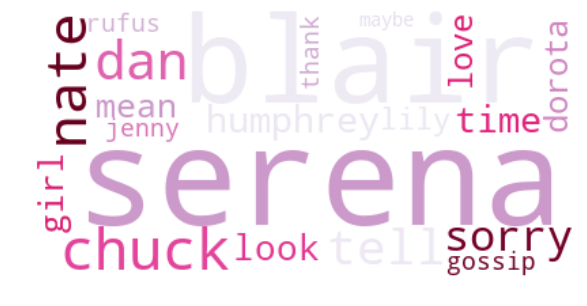

122___Malcolm_In_The_Middle


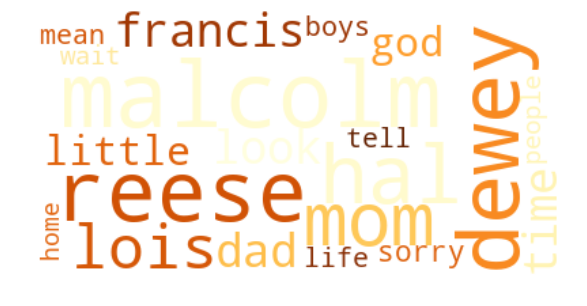

12___Doctor_Who


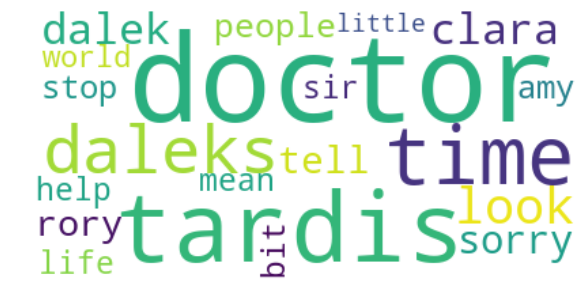

132___NCIS


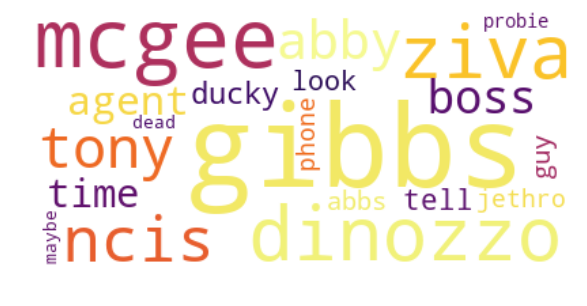

152___Star_Trek__The_Animated_Series


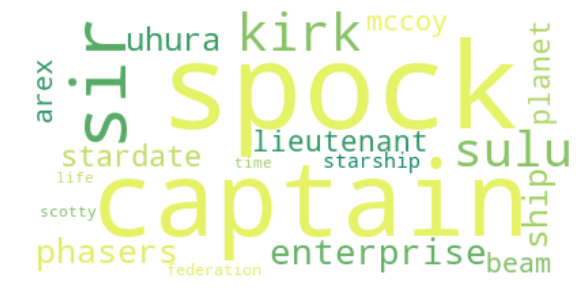

15___House


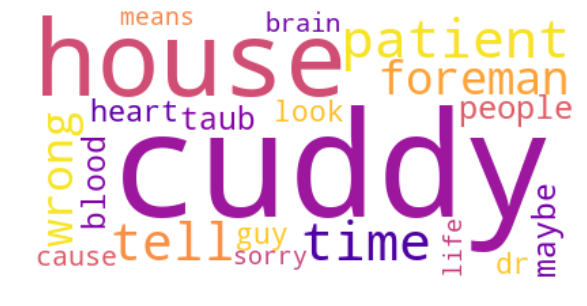

16___Desperate_Housewives


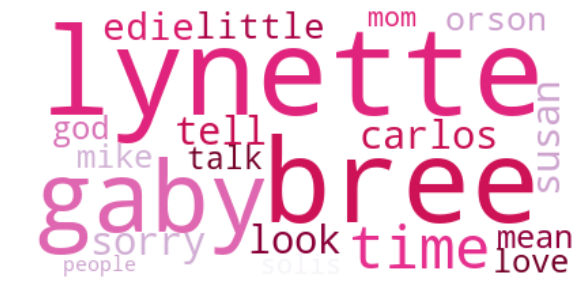

182___Friends


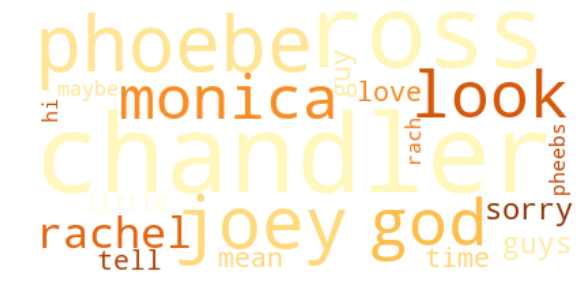

186___American_Dad


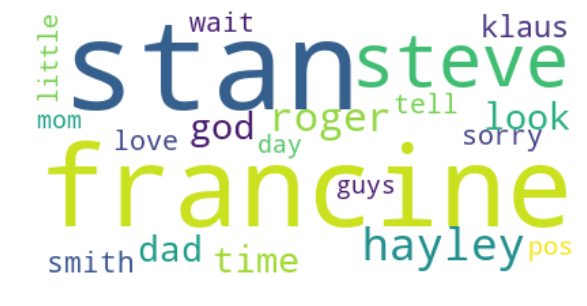

1___Lost


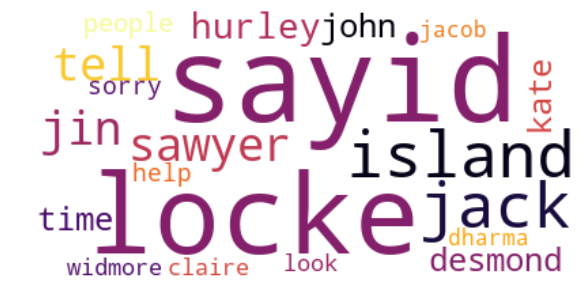

2381___Scandal


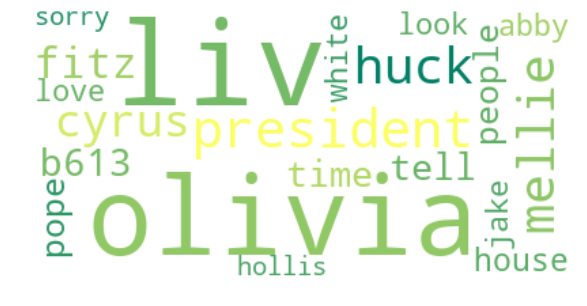

240___Breaking_Bad


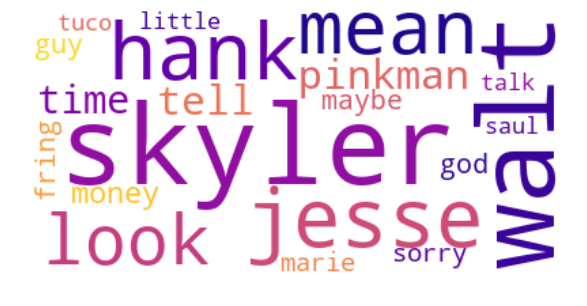

24___Scrubs


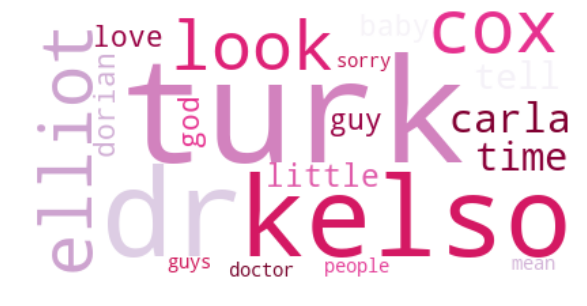

262___Only_Fools_and_Horses


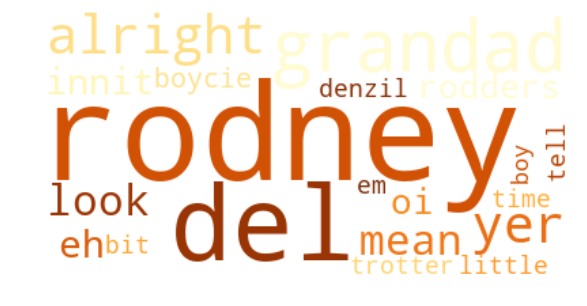

2766___Major_Crimes


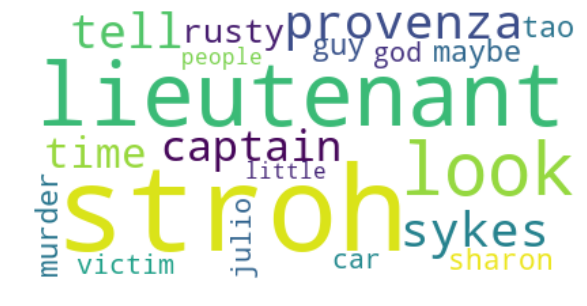

28___Bones


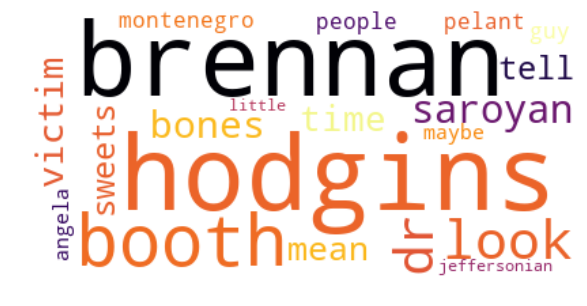

2964___Vikings


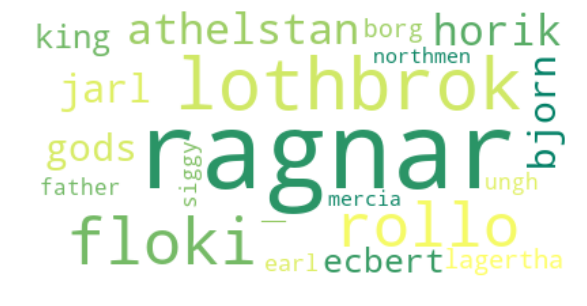

2___Heroes


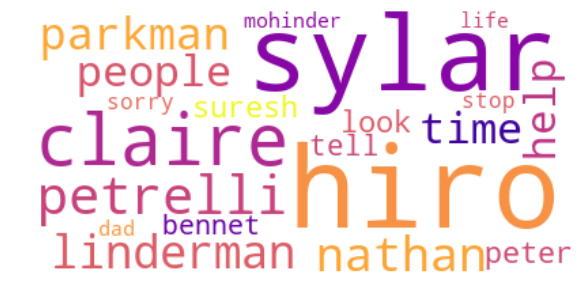

30___Grey_s_Anatomy


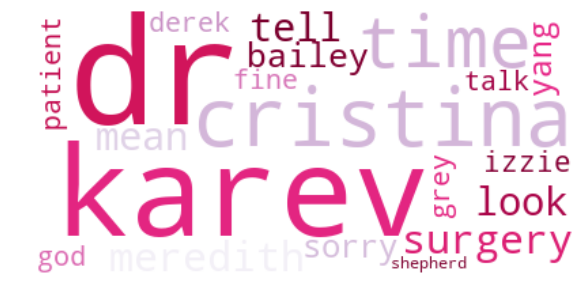

3103___House_of_Cards_(2013)


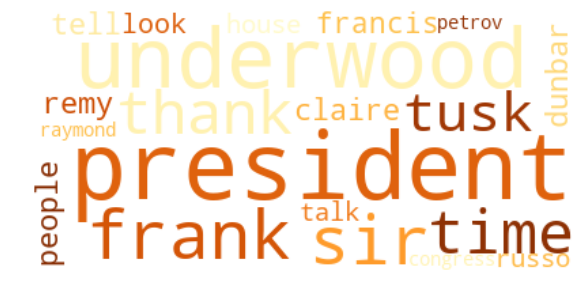

32___Veronica_Mars


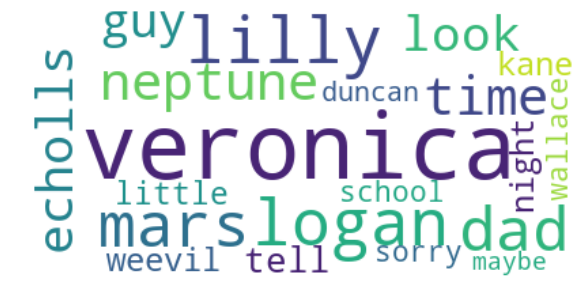

334___Buffy_The_Vampire_Slayer


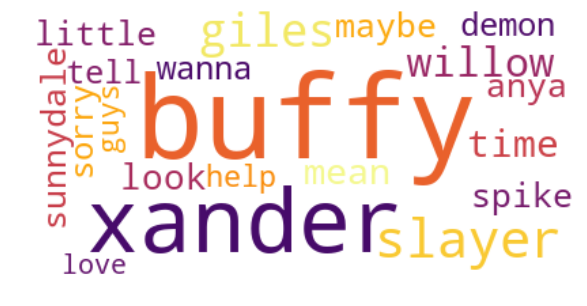

364___Legend_of_the_Seeker


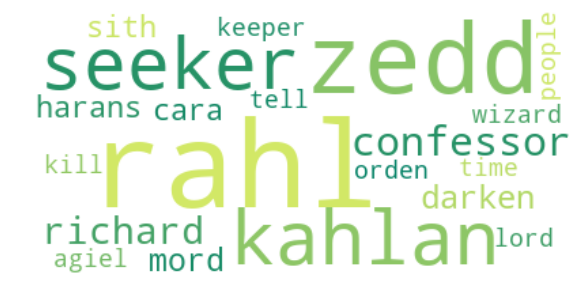

366___True_Blood


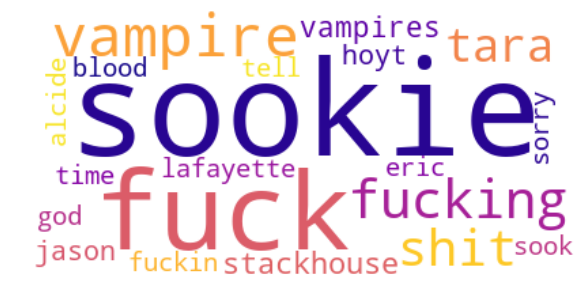

376___The_Mentalist


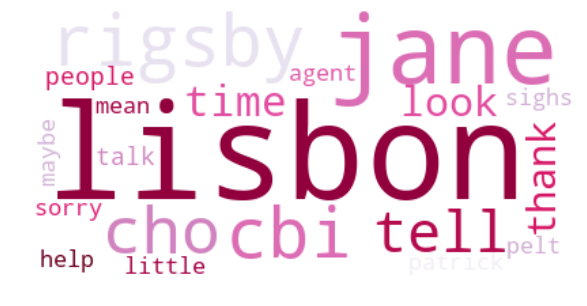

384___H2O__Just_Add_Water


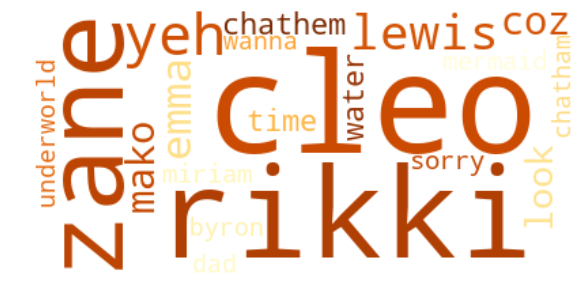

3861___Orange_is_the_New_Black


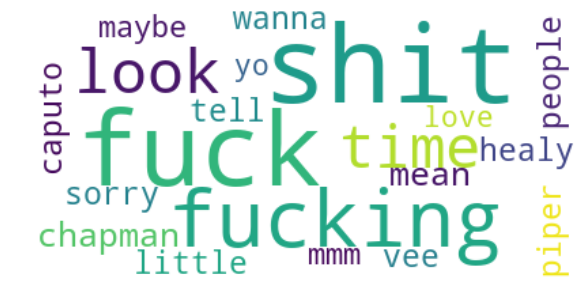

3990___Peaky_Blinders


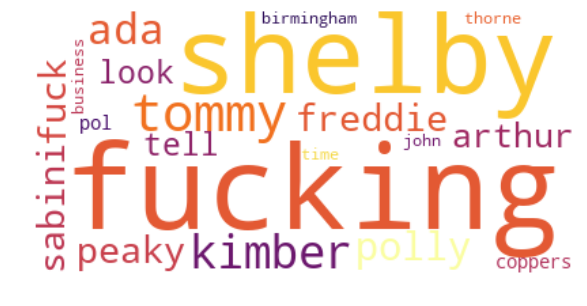

406___Agatha_Christie__Poirot


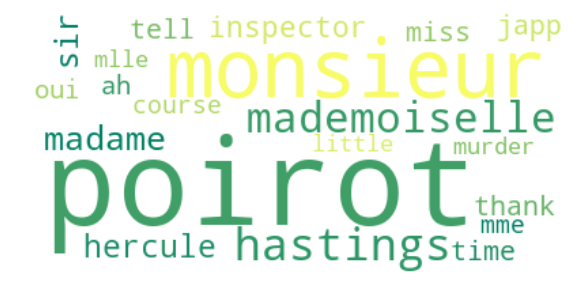

4679___Outlander


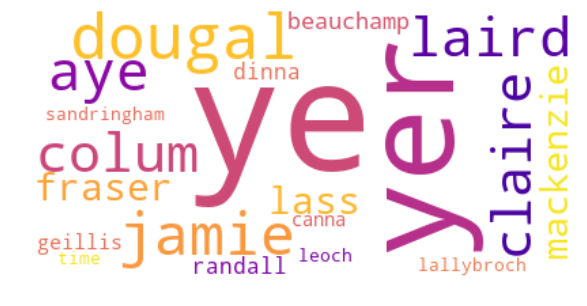

46___The_Tudors


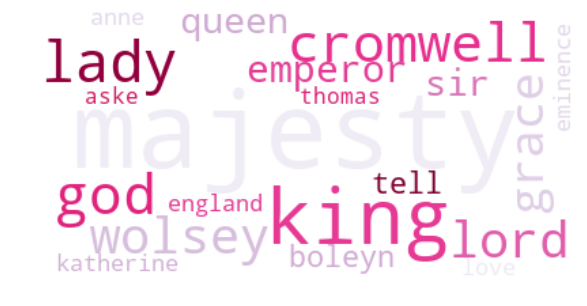

48___Everybody_Hates_Chris


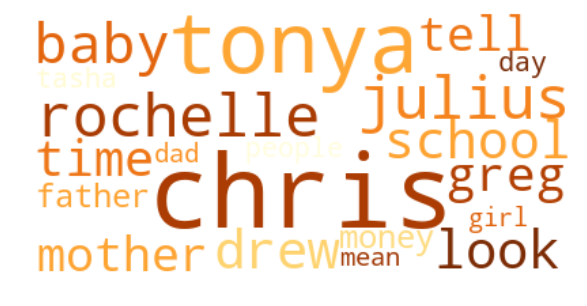

4___Prison_Break


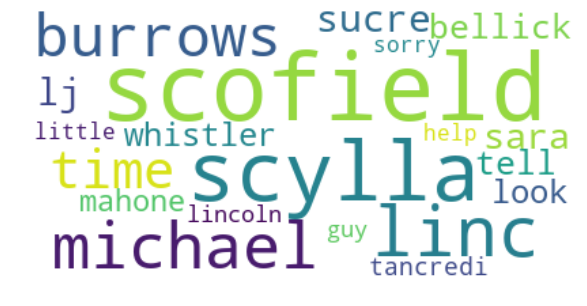

51___How_I_Met_Your_Mother


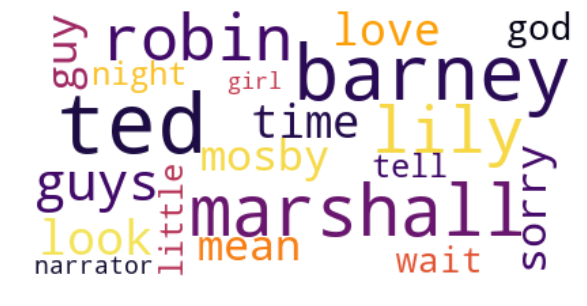

5423___The_Last_Kingdom


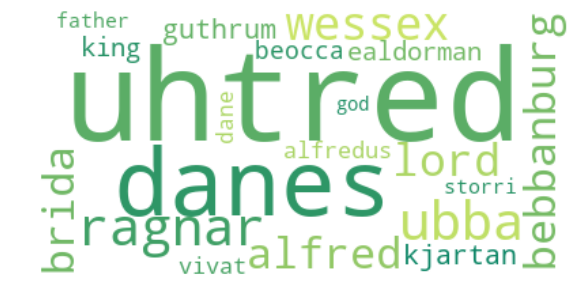

54___Seinfeld


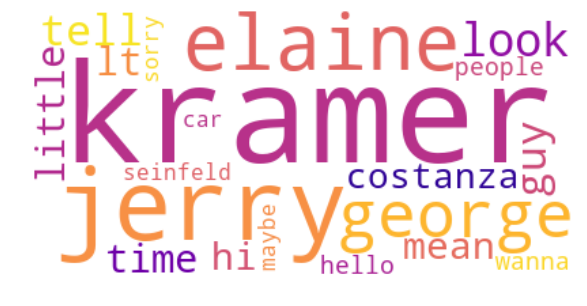

55___The_Sopranos


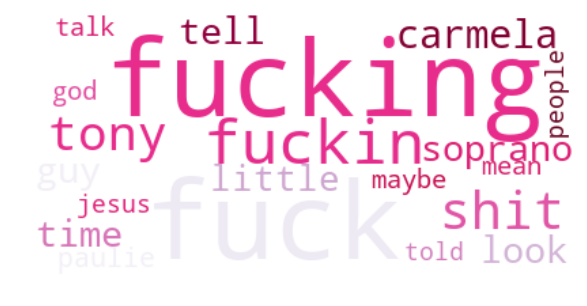

565___Andromeda


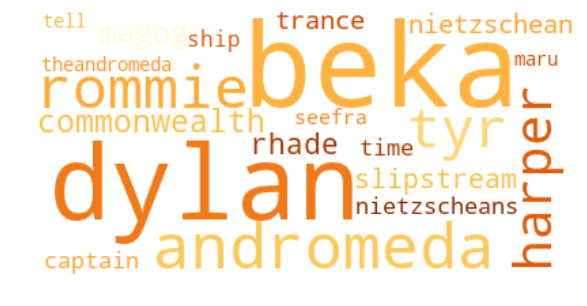

57___CSI__Crime_Scene_Investigation


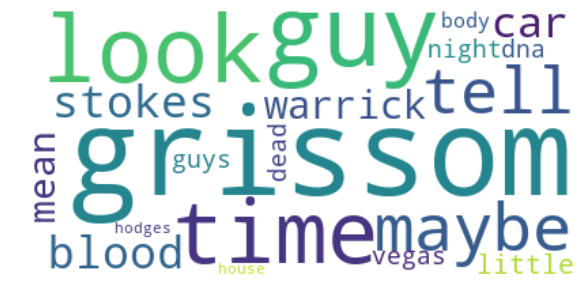

597___Charmed


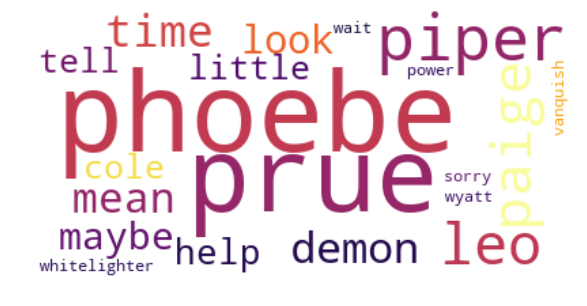

5___Supernatural


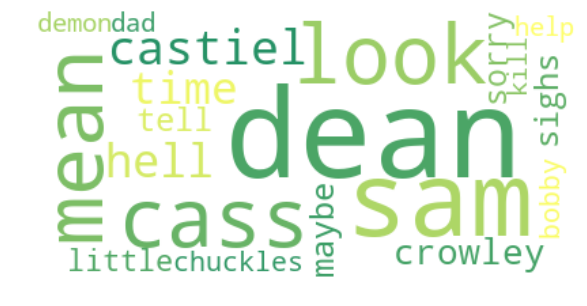

600___The_Vampire_Diaries


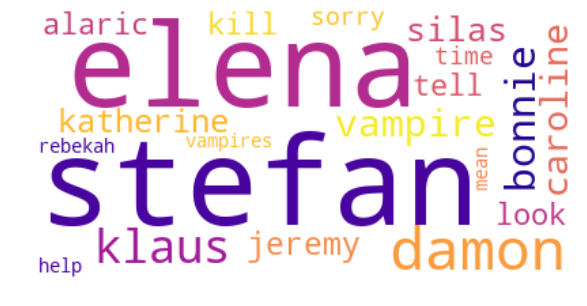

615___The_Good_Wife


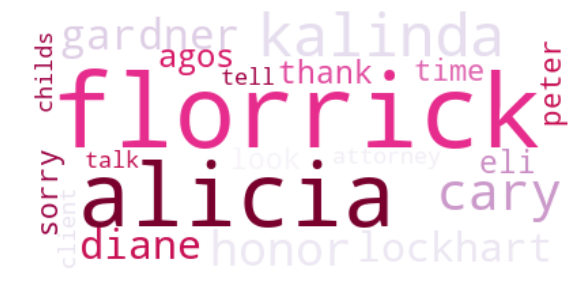

630___The_Nanny


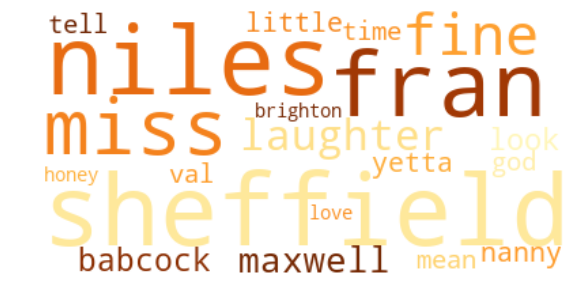

66___Ugly_Betty


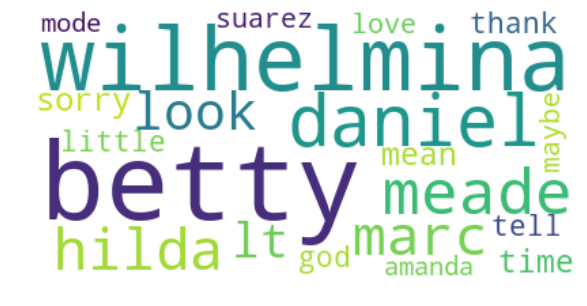

68___Black_Books


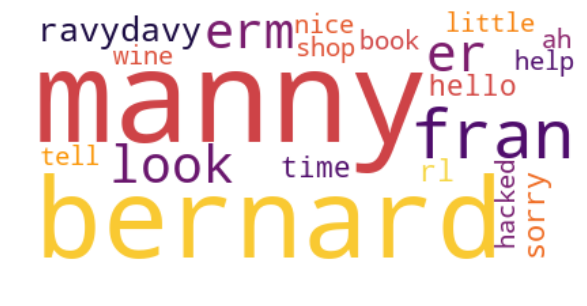

6___Dexter


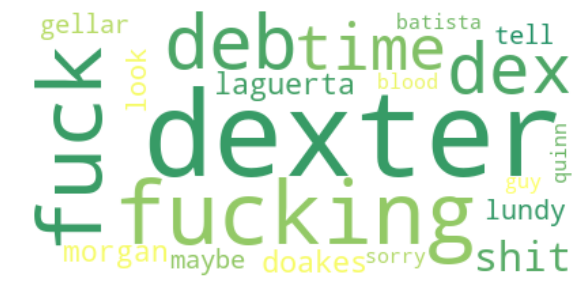

71___The_Wire


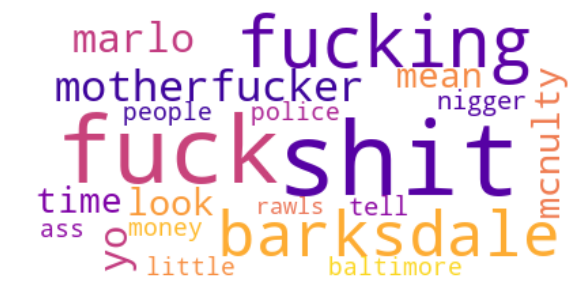

73___Rome


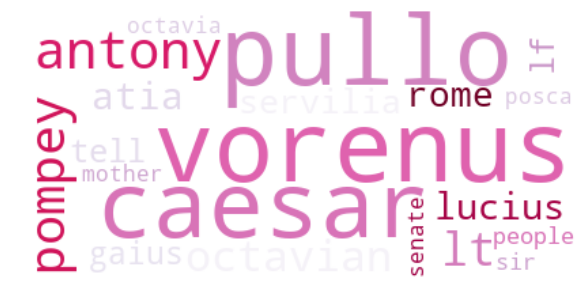

793___The_League_of_Gentlemen


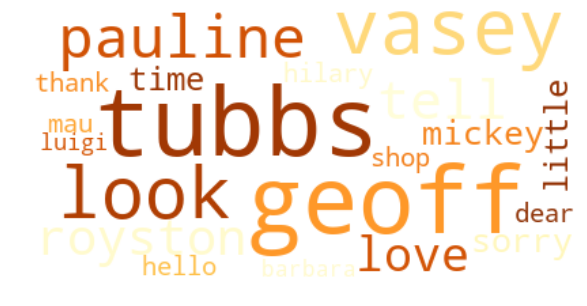

79___The_Office_(UK)


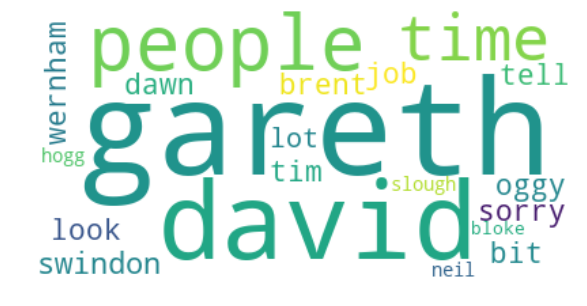

880___Pretty_Little_Liars


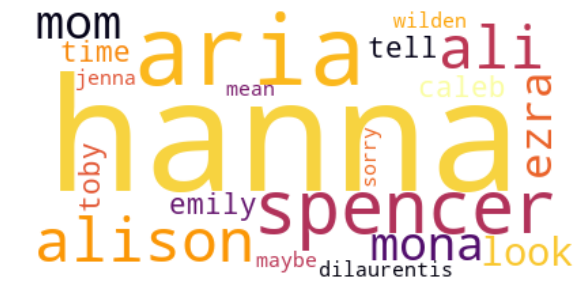

95___Sex___the_City


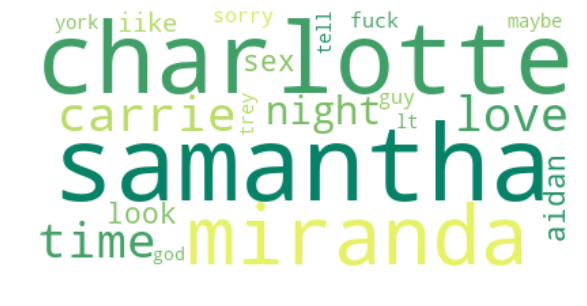

In [17]:
nlargest = 20
order = np.argsort(-df.values, axis=1)[:, :nlargest]
colormaps_list = ["viridis", "inferno", "summer", "plasma", "PuRd", "YlOrBr"]
cm_ind = 0
for i in range(len(df)):
    ind = order[i]
    d = dict()
    for j in range(len(ind)):
        w = df.columns[ind[j]]
        tfidf = df[df.columns[ind[j]]].loc[i]
        d[w] = tfidf
    
    if cm_ind == len(colormaps_list):
        cm_ind = 0
    wordcloud = WordCloud(background_color="white", colormap=colormaps_list[cm_ind])
    cm_ind += 1
    wordcloud.generate_from_frequencies(frequencies=d)
    plt.figure( figsize=(15,5) )
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    serie = d_name[i+1]
    print(serie)
    plt.show()
    wordcloud.to_file("wordclouds/"+serie+"_20_top_TFIDF.png")

Les prenoms apparaissent souvent dans les plus grands tf-idf.

Pb : on risque aussi de retirer du vocabulaire thématique en virant les plus grands tf-idf, exemples:
- Dans *The Tudors*: "majesty", "king", "lady", "lord", "england"
- Dans *The Nanny* : "nanny"
- Dans les series medicales : "dr"
- Dans *Vampire Diaries* : "vampire"

# Mot n'apparaissant que n fois dans un corpus:

In [21]:
vectorizer = CountVectorizer(stop_words = stopwords_set)
X_tf = vectorizer.fit_transform(corpus)
df_tf = pd.DataFrame(X_tf.toarray(), columns=vectorizer.get_feature_names())

In [23]:
somme_df = df_tf.sum(axis=0)

In [24]:
seuil = 5
mots = set()
for i in range(len(somme_df)):
    word = somme_df.index[i]
    if somme_df[word] <= seuil:
        mots.add(word)
mots

{'dwayney',
 'somno',
 'cyclists',
 'drawthis',
 'evergood',
 'imprudent',
 'intrudes',
 'ported',
 'tdk',
 'pubicide',
 'outcropping',
 'discúlpame',
 'moogly',
 'neverhappen',
 'oqr',
 'paden',
 'tati',
 'wyatts',
 'pushrod',
 'triagedthese',
 'ramped',
 'consoles',
 'eurocentric',
 '1x07',
 'marchetti',
 'changedso',
 'layup',
 'clinda',
 'scoobyage',
 'vacs',
 'zachs',
 'herhusband',
 'ñëýïë',
 'bandadges',
 'playpens',
 'meekitjuk',
 'catchup',
 'kendal',
 'rast',
 'welcom',
 'goddins',
 'amnothinglike',
 'alliterates',
 'passhrough',
 'mfms',
 'superla',
 'qualifi',
 'peppered',
 'dubya',
 'prostituting',
 'undoes',
 'kwons',
 'soils',
 'tetraglyph',
 'brimley',
 'eiectrocution',
 'giro',
 'veinous',
 'diagnstic',
 'kelch',
 'kinematically',
 'mcranger',
 'mookjaiaporn',
 'sesterces',
 'ahorita',
 'rance',
 'so5e10',
 'thiswas',
 'vindictiveness',
 'wasgoing',
 'adelante',
 'ryvlan',
 'hba1c',
 'turncoatin',
 'inhis',
 'costumier',
 'beenervi',
 'dath',
 'beckoned',
 'gatherin',


On pourra passer ces mots en stopwords.

Fun fact : 'triskaidekaphobia' est la peur du nombre 13. Ce mot apparait dans la série *Friends*.

# Recommandation SVM améliorée

Pour chaque série on train le SVM sur les autres séries et on essaie de la classifier dedans

In [21]:
path = "/Vrac/PLDAC_reco/cleaned_data_reco_bayes"

corpus = get_corpus(path, texts_as="episodes")

In [22]:
d_info, d_name = getDicts(path)

In [37]:
s = d_info[1]

92

In [43]:
X = getTfidfSparseMat(corpus, my_stopwords = stopwords_set)

In [57]:
#Labelisation
nb_eps_per_show = []
for i in range(1, len(d_info.keys())+1):
    nb_eps_per_show.append(sum(d_info[i].values()))
Y = []
nb_shows = len(nb_eps_per_show)
somme_cumul = np.cumsum(nb_eps_per_show)
indMin = 0
for i in range(0, nb_shows):
    indMax = somme_cumul[i]
    for j in range(indMin, indMax):
        Y.append(i+1)
    indMin = indMax

In [72]:
cpt = 0
nb_series = len(d_name)
for i in range(nb_series):
    id_serie = i+1
    serie_rep = d_info[id_serie]
    nb_saisons = len(serie_rep)
    nb_episodes = sum(list(serie_rep.values()))
    
    X_test = X[cpt:cpt+nb_episodes]
    X_train = vstack([X[0:cpt],X[nb_episodes+cpt:]])
    Y_train = Y[0:cpt]+Y[nb_episodes+cpt:]
    
    # Linear SVM
    lsvm_clf = svm.LinearSVC()
    lsvm_clf.fit(X_train, Y_train)
    
    predictions = lsvm_clf.predict(X_test)
    predictions = list(predictions)
    pred = max(predictions,key=predictions.count)
    
    print("-----------------------------------------------------------------------\n")
    nomSerie = d_name[id_serie]
    print("Si vous avez aimé la série "+str(nomSerie)+"\n")
    nomSerieReco = d_name[pred]
    print("\tvous aimerez sûrement la série "+str(nomSerieReco)+"\n")
    
    
    cpt += nb_episodes    

-----------------------------------------------------------------------

Si vous avez aimé la série 108___Mad_Men

	vous aimerez sûrement la série 186___American_Dad

-----------------------------------------------------------------------

Si vous avez aimé la série 10___Smallville

	vous aimerez sûrement la série 57___CSI__Crime_Scene_Investigation

-----------------------------------------------------------------------

Si vous avez aimé la série 1149___Downton_Abbey

	vous aimerez sûrement la série 12___Doctor_Who

-----------------------------------------------------------------------

Si vous avez aimé la série 119___Robin_Hood

	vous aimerez sûrement la série 51___How_I_Met_Your_Mother

-----------------------------------------------------------------------

Si vous avez aimé la série 121___Gossip_Girl

	vous aimerez sûrement la série 51___How_I_Met_Your_Mother

-----------------------------------------------------------------------

Si vous avez aimé la série 122___Malcolm_In_Th

-----------------------------------------------------------------------

Si vous avez aimé la série 630___The_Nanny

	vous aimerez sûrement la série 68___Black_Books

-----------------------------------------------------------------------

Si vous avez aimé la série 66___Ugly_Betty

	vous aimerez sûrement la série 108___Mad_Men

-----------------------------------------------------------------------

Si vous avez aimé la série 68___Black_Books

	vous aimerez sûrement la série 630___The_Nanny

-----------------------------------------------------------------------

Si vous avez aimé la série 6___Dexter

	vous aimerez sûrement la série 57___CSI__Crime_Scene_Investigation

-----------------------------------------------------------------------

Si vous avez aimé la série 71___The_Wire

	vous aimerez sûrement la série 3861___Orange_is_the_New_Black

-----------------------------------------------------------------------

Si vous avez aimé la série 73___Rome

	vous aimerez sûrement la série

### En enlevant les plus grands tf-idf

In [25]:
nlargest = 20
order = np.argsort(-df.values, axis=1)[:, :nlargest]
top_TFIDF = set(df.columns[order])
stopw = copy.deepcopy(stopwords_set)
for w in top_TFIDF:
    stopw.add(w)

In [27]:
X = getTfidfSparseMat(corpus, my_stopwords = stopw)

In [16]:
#Labelisation
nb_eps_per_show = []
for i in range(1, len(d_info.keys())+1):
    nb_eps_per_show.append(sum(d_info[i].values()))
Y = []
nb_shows = len(nb_eps_per_show)
somme_cumul = np.cumsum(nb_eps_per_show)
indMin = 0
for i in range(0, nb_shows):
    indMax = somme_cumul[i]
    for j in range(indMin, indMax):
        Y.append(i+1)
    indMin = indMax

In [80]:
cpt = 0
nb_series = len(d_name)
for i in range(nb_series):
    id_serie = i+1
    serie_rep = d_info[id_serie]
    nb_saisons = len(serie_rep)
    nb_episodes = sum(list(serie_rep.values()))
    
    X_test = X[cpt:cpt+nb_episodes]
    X_train = vstack([X[0:cpt],X[nb_episodes+cpt:]])
    Y_train = Y[0:cpt]+Y[nb_episodes+cpt:]
    
    # Linear SVM
    lsvm_clf = svm.LinearSVC()
    lsvm_clf.fit(X_train, Y_train)
    
    predictions = lsvm_clf.predict(X_test)
    predictions = list(predictions)
    pred = max(predictions,key=predictions.count)
    
    print("-----------------------------------------------------------------------\n")
    nomSerie = d_name[id_serie]
    print("Si vous avez aimé la série "+str(nomSerie)+"\n")
    nomSerieReco = d_name[pred]
    print("\tvous aimerez sûrement la série "+str(nomSerieReco)+"\n")
    
    
    cpt += nb_episodes    

-----------------------------------------------------------------------

Si vous avez aimé la série 108___Mad_Men

	vous aimerez sûrement la série 54___Seinfeld

-----------------------------------------------------------------------

Si vous avez aimé la série 10___Smallville

	vous aimerez sûrement la série 2___Heroes

-----------------------------------------------------------------------

Si vous avez aimé la série 1149___Downton_Abbey

	vous aimerez sûrement la série 406___Agatha_Christie__Poirot

-----------------------------------------------------------------------

Si vous avez aimé la série 119___Robin_Hood

	vous aimerez sûrement la série 12___Doctor_Who

-----------------------------------------------------------------------

Si vous avez aimé la série 121___Gossip_Girl

	vous aimerez sûrement la série 880___Pretty_Little_Liars

-----------------------------------------------------------------------

Si vous avez aimé la série 122___Malcolm_In_The_Middle

	vous aimerez sûre

-----------------------------------------------------------------------

Si vous avez aimé la série 66___Ugly_Betty

	vous aimerez sûrement la série 182___Friends

-----------------------------------------------------------------------

Si vous avez aimé la série 68___Black_Books

	vous aimerez sûrement la série 12___Doctor_Who

-----------------------------------------------------------------------

Si vous avez aimé la série 6___Dexter

	vous aimerez sûrement la série 57___CSI__Crime_Scene_Investigation

-----------------------------------------------------------------------

Si vous avez aimé la série 71___The_Wire

	vous aimerez sûrement la série 55___The_Sopranos

-----------------------------------------------------------------------

Si vous avez aimé la série 73___Rome

	vous aimerez sûrement la série 2964___Vikings

-----------------------------------------------------------------------

Si vous avez aimé la série 793___The_League_of_Gentlemen

	vous aimerez sûrement la série 

### Enlever les mots apparaissant peu dans le corpus

In [29]:
vectorizer = CountVectorizer(stop_words = stopw)
X_tf = vectorizer.fit_transform(corpus)
df_tf = pd.DataFrame(X_tf.toarray(), columns=vectorizer.get_feature_names())

In [30]:
somme_df = df_tf.sum(axis=0)

In [32]:
seuil = 5
mots = set()
for i in range(len(somme_df)):
    word = somme_df.index[i]
    if somme_df[word] <= seuil:
        mots.add(word)

In [33]:
for w in mots:
    stopw.add(w)

In [34]:
X = getTfidfSparseMat(corpus, my_stopwords = stopw)

In [86]:
#Labelisation
nb_eps_per_show = []
for i in range(1, len(d_info.keys())+1):
    nb_eps_per_show.append(sum(d_info[i].values()))
Y = []
nb_shows = len(nb_eps_per_show)
somme_cumul = np.cumsum(nb_eps_per_show)
indMin = 0
for i in range(0, nb_shows):
    indMax = somme_cumul[i]
    for j in range(indMin, indMax):
        Y.append(i+1)
    indMin = indMax

In [87]:
cpt = 0
nb_series = len(d_name)
for i in range(nb_series):
    id_serie = i+1
    serie_rep = d_info[id_serie]
    nb_saisons = len(serie_rep)
    nb_episodes = sum(list(serie_rep.values()))
    
    X_test = X[cpt:cpt+nb_episodes]
    X_train = vstack([X[0:cpt],X[nb_episodes+cpt:]])
    Y_train = Y[0:cpt]+Y[nb_episodes+cpt:]
    
    # Linear SVM
    lsvm_clf = svm.LinearSVC()
    lsvm_clf.fit(X_train, Y_train)
    
    predictions = lsvm_clf.predict(X_test)
    predictions = list(predictions)
    pred = max(predictions,key=predictions.count)
    
    print("-----------------------------------------------------------------------\n")
    nomSerie = d_name[id_serie]
    print("Si vous avez aimé la série "+str(nomSerie)+"\n")
    nomSerieReco = d_name[pred]
    print("\tvous aimerez sûrement la série "+str(nomSerieReco)+"\n")
    
    
    cpt += nb_episodes

-----------------------------------------------------------------------

Si vous avez aimé la série 108___Mad_Men

	vous aimerez sûrement la série 54___Seinfeld

-----------------------------------------------------------------------

Si vous avez aimé la série 10___Smallville

	vous aimerez sûrement la série 2___Heroes

-----------------------------------------------------------------------

Si vous avez aimé la série 1149___Downton_Abbey

	vous aimerez sûrement la série 406___Agatha_Christie__Poirot

-----------------------------------------------------------------------

Si vous avez aimé la série 119___Robin_Hood

	vous aimerez sûrement la série 364___Legend_of_the_Seeker

-----------------------------------------------------------------------

Si vous avez aimé la série 121___Gossip_Girl

	vous aimerez sûrement la série 95___Sex___the_City

-----------------------------------------------------------------------

Si vous avez aimé la série 122___Malcolm_In_The_Middle

	vous aimerez

-----------------------------------------------------------------------

Si vous avez aimé la série 66___Ugly_Betty

	vous aimerez sûrement la série 182___Friends

-----------------------------------------------------------------------

Si vous avez aimé la série 68___Black_Books

	vous aimerez sûrement la série 12___Doctor_Who

-----------------------------------------------------------------------

Si vous avez aimé la série 6___Dexter

	vous aimerez sûrement la série 57___CSI__Crime_Scene_Investigation

-----------------------------------------------------------------------

Si vous avez aimé la série 71___The_Wire

	vous aimerez sûrement la série 55___The_Sopranos

-----------------------------------------------------------------------

Si vous avez aimé la série 73___Rome

	vous aimerez sûrement la série 2964___Vikings

-----------------------------------------------------------------------

Si vous avez aimé la série 793___The_League_of_Gentlemen

	vous aimerez sûrement la série 

### Weights

In [37]:
path = "/Vrac/PLDAC_reco/cleaned_data_reco_bayes"
corpus = get_corpus(path, texts_as="episodes")
X, df = getTfidfSparseMatAndDataFrame(corpus, my_stopwords=stopw)

In [39]:
d_info, d_name = getDicts(path)

In [40]:
#Labelisation
nb_eps_per_show = []
for i in range(1, len(d_info.keys())+1):
    nb_eps_per_show.append(sum(d_info[i].values()))
Y = []
nb_shows = len(nb_eps_per_show)
somme_cumul = np.cumsum(nb_eps_per_show)
indMin = 0
for i in range(0, nb_shows):
    indMax = somme_cumul[i]
    for j in range(indMin, indMax):
        Y.append(i+1)
    indMin = indMax

In [41]:
weights = abs(svm.LinearSVC().fit(X,Y).coef_)

108___Mad_Men


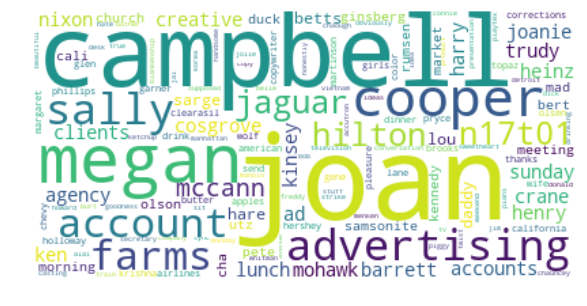

10___Smallville


<Figure size 1440x720 with 0 Axes>

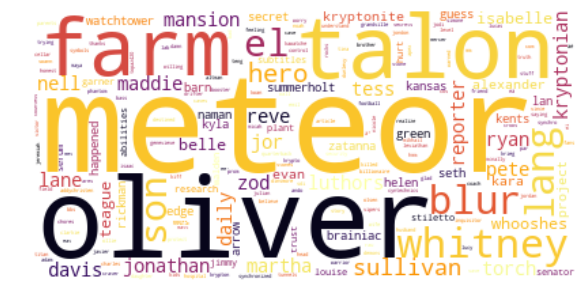

1149___Downton_Abbey


<Figure size 1440x720 with 0 Axes>

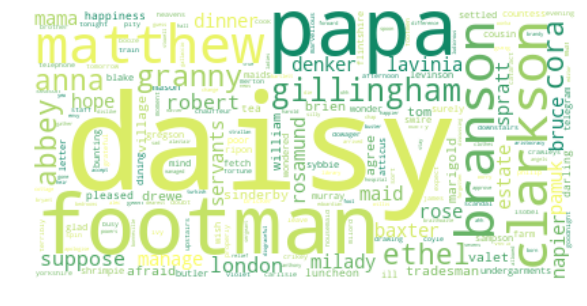

119___Robin_Hood


<Figure size 1440x720 with 0 Axes>

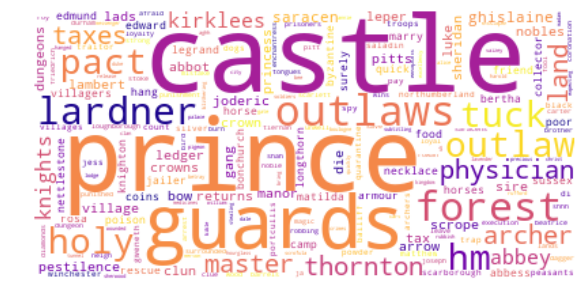

121___Gossip_Girl


<Figure size 1440x720 with 0 Axes>

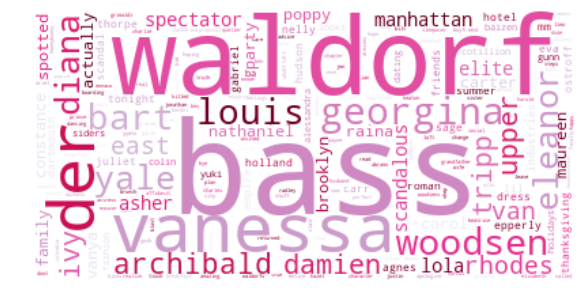

122___Malcolm_In_The_Middle


<Figure size 1440x720 with 0 Axes>

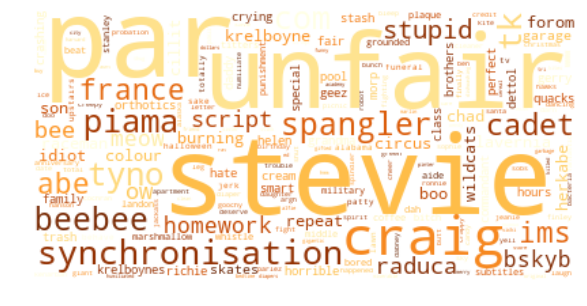

12___Doctor_Who


<Figure size 1440x720 with 0 Axes>

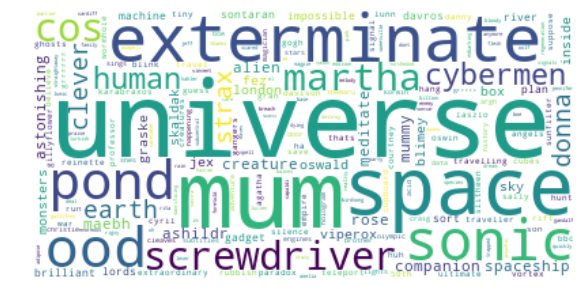

132___NCIS


<Figure size 1440x720 with 0 Axes>

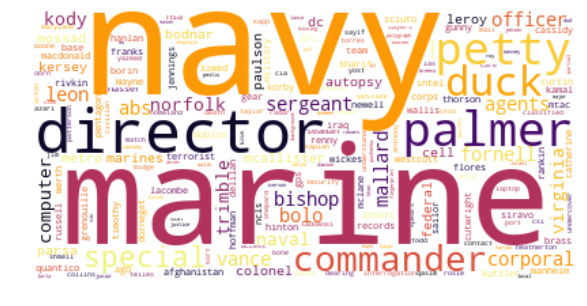

152___Star_Trek__The_Animated_Series


<Figure size 1440x720 with 0 Axes>

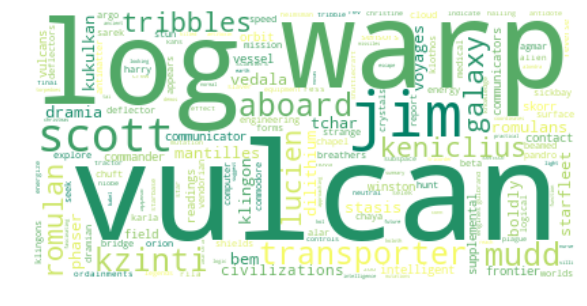

15___House


<Figure size 1440x720 with 0 Axes>

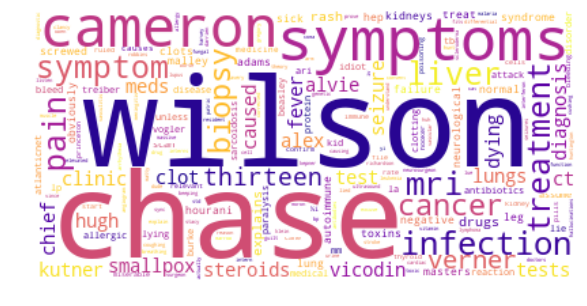

16___Desperate_Housewives


<Figure size 1440x720 with 0 Axes>

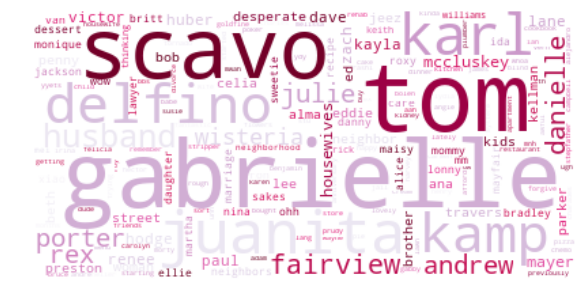

182___Friends


<Figure size 1440x720 with 0 Axes>

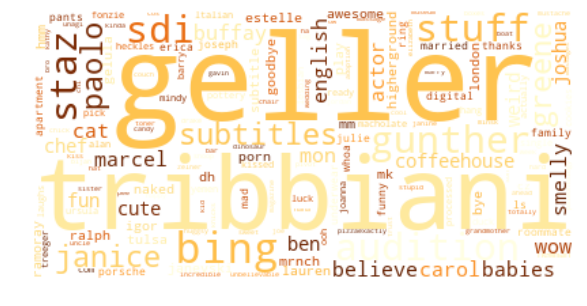

186___American_Dad


<Figure size 1440x720 with 0 Axes>

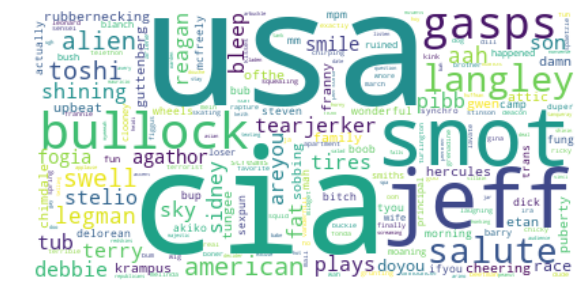

1___Lost


<Figure size 1440x720 with 0 Axes>

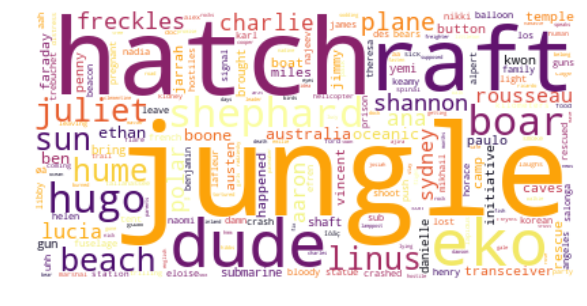

2381___Scandal


<Figure size 1440x720 with 0 Axes>

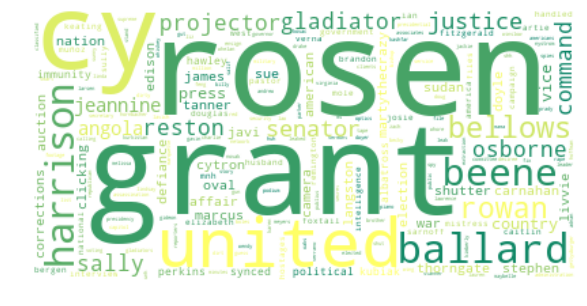

240___Breaking_Bad


<Figure size 1440x720 with 0 Axes>

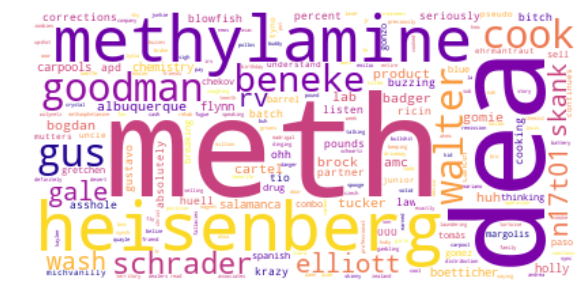

24___Scrubs


<Figure size 1440x720 with 0 Axes>

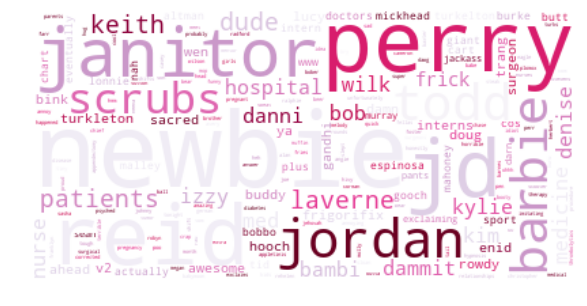

262___Only_Fools_and_Horses


<Figure size 1440x720 with 0 Axes>

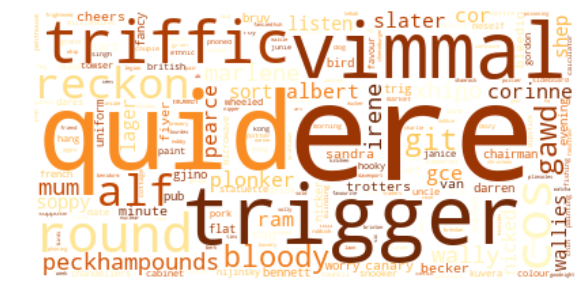

2766___Major_Crimes


<Figure size 1440x720 with 0 Axes>

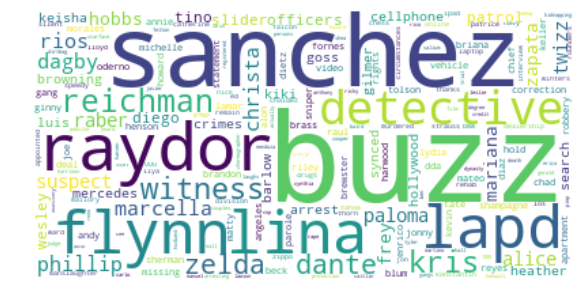

28___Bones


<Figure size 1440x720 with 0 Axes>

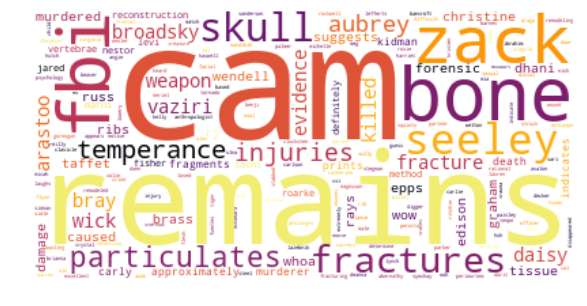

2964___Vikings


<Figure size 1440x720 with 0 Axes>

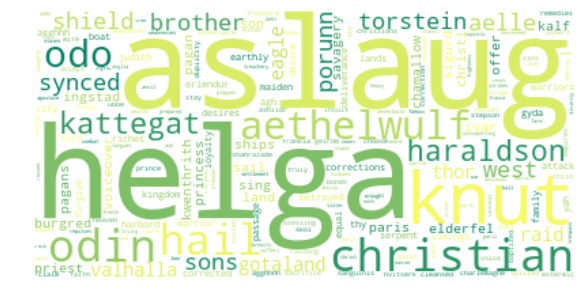

2___Heroes


<Figure size 1440x720 with 0 Axes>

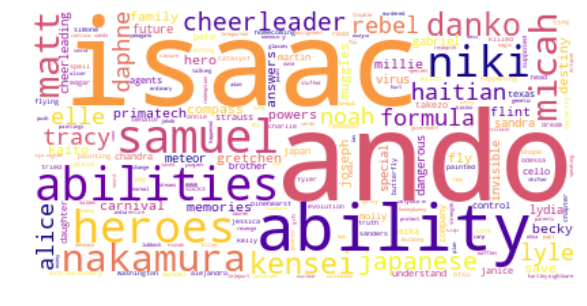

30___Grey_s_Anatomy


<Figure size 1440x720 with 0 Axes>

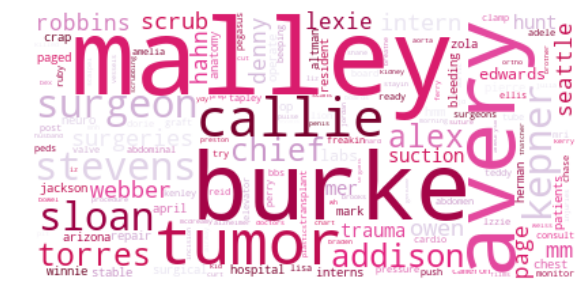

3103___House_of_Cards_(2013)


<Figure size 1440x720 with 0 Axes>

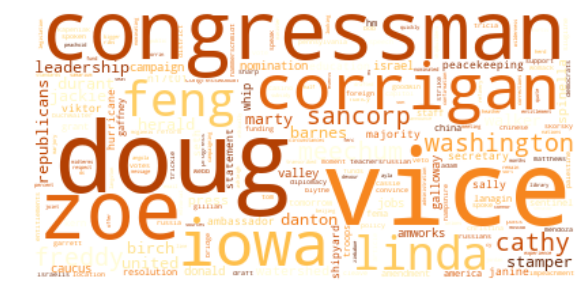

32___Veronica_Mars


<Figure size 1440x720 with 0 Axes>

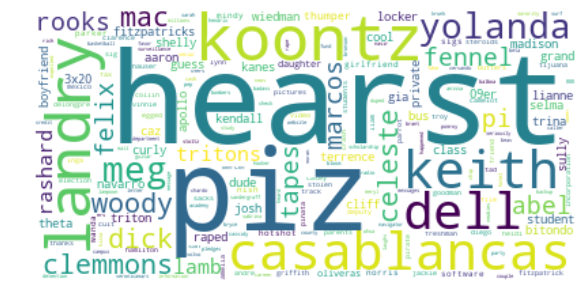

334___Buffy_The_Vampire_Slayer


<Figure size 1440x720 with 0 Axes>

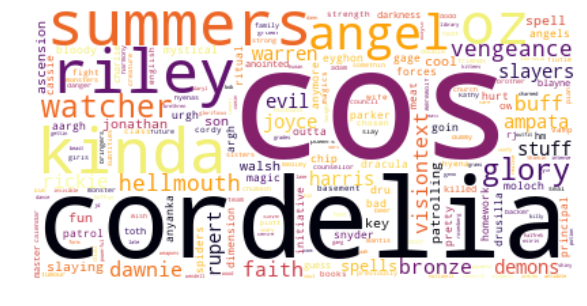

364___Legend_of_the_Seeker


<Figure size 1440x720 with 0 Axes>

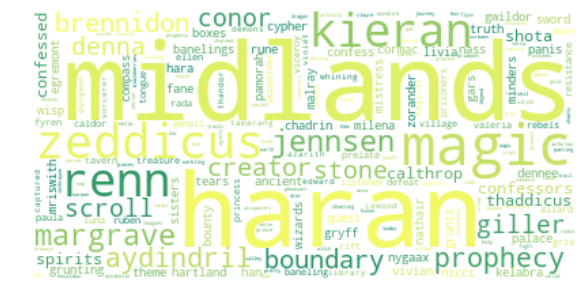

366___True_Blood


<Figure size 1440x720 with 0 Axes>

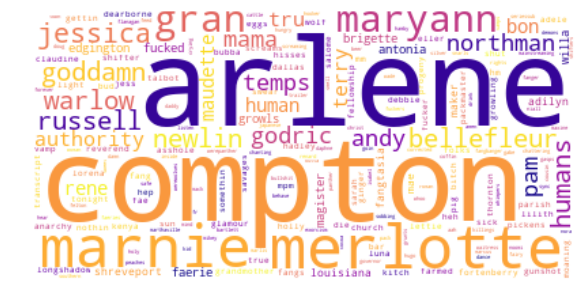

376___The_Mentalist


<Figure size 1440x720 with 0 Axes>

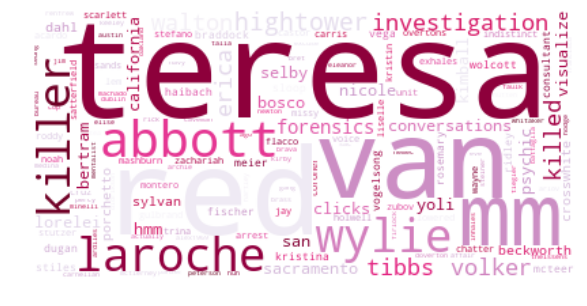

384___H2O__Just_Add_Water


<Figure size 1440x720 with 0 Axes>

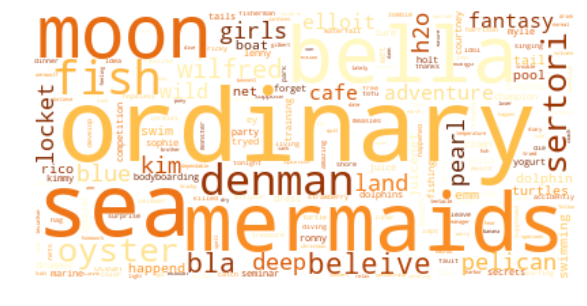

3861___Orange_is_the_New_Black


<Figure size 1440x720 with 0 Axes>

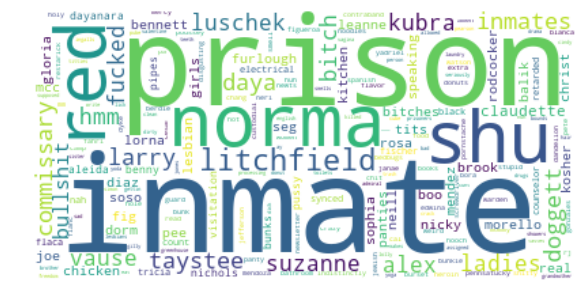

3990___Peaky_Blinders


<Figure size 1440x720 with 0 Axes>

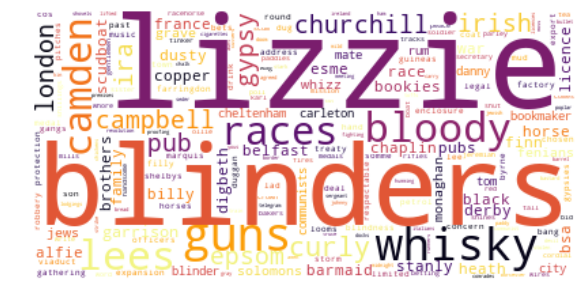

406___Agatha_Christie__Poirot


<Figure size 1440x720 with 0 Axes>

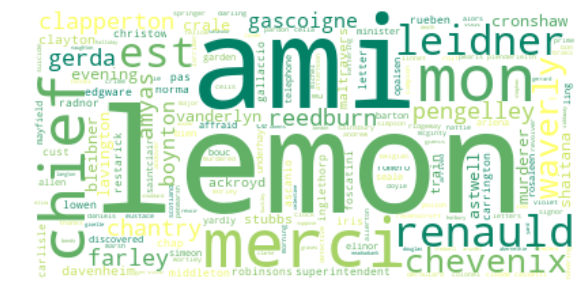

4679___Outlander


<Figure size 1440x720 with 0 Axes>

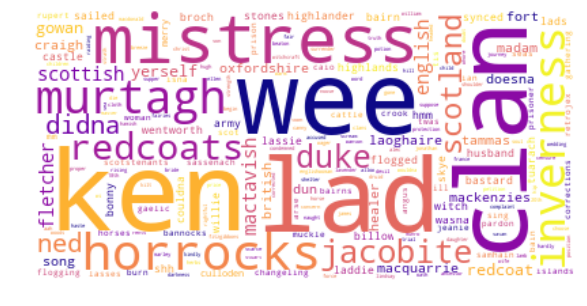

46___The_Tudors


<Figure size 1440x720 with 0 Axes>

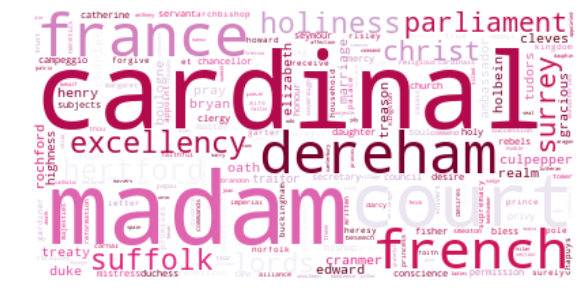

48___Everybody_Hates_Chris


<Figure size 1440x720 with 0 Axes>

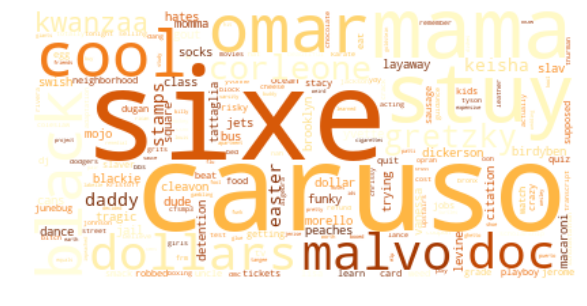

4___Prison_Break


<Figure size 1440x720 with 0 Axes>

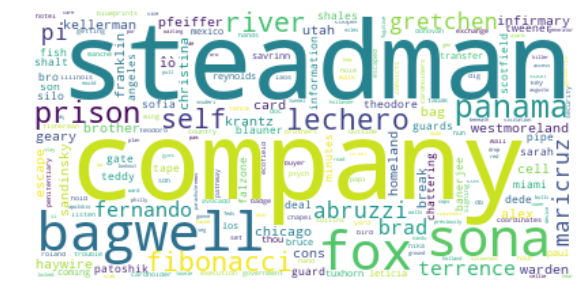

51___How_I_Met_Your_Mother


<Figure size 1440x720 with 0 Axes>

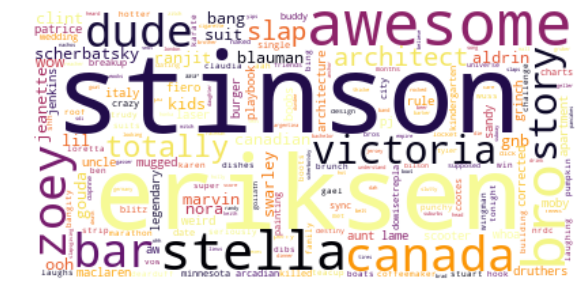

5423___The_Last_Kingdom


<Figure size 1440x720 with 0 Axes>

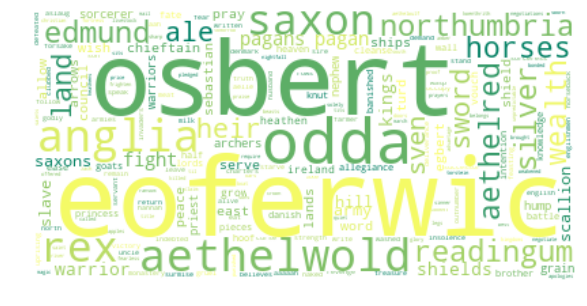

54___Seinfeld


<Figure size 1440x720 with 0 Axes>

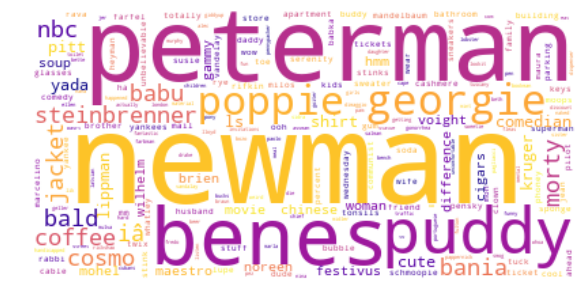

55___The_Sopranos


<Figure size 1440x720 with 0 Axes>

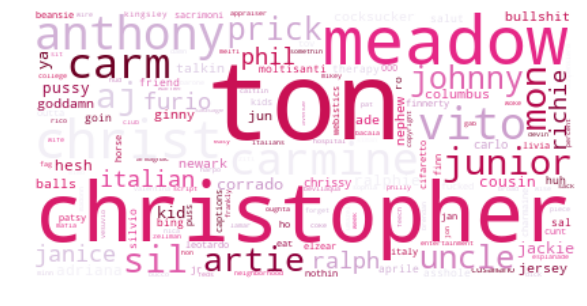

565___Andromeda


<Figure size 1440x720 with 0 Axes>

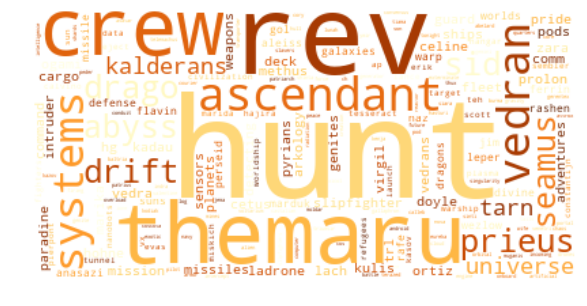

57___CSI__Crime_Scene_Investigation


<Figure size 1440x720 with 0 Axes>

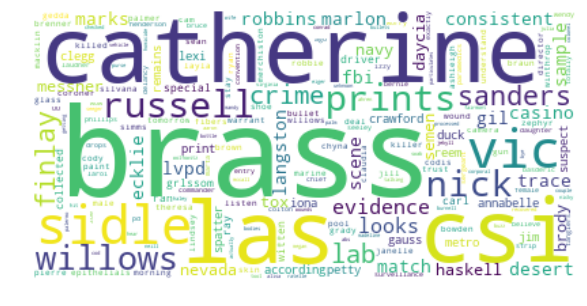

597___Charmed


<Figure size 1440x720 with 0 Axes>

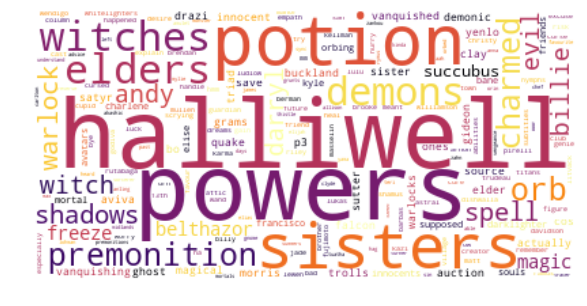

5___Supernatural


<Figure size 1440x720 with 0 Axes>

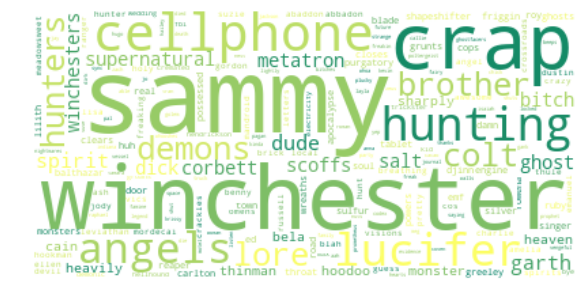

600___The_Vampire_Diaries


<Figure size 1440x720 with 0 Axes>

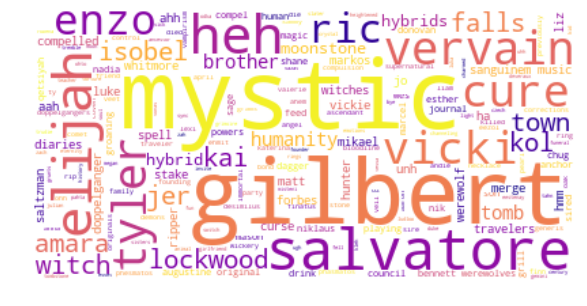

615___The_Good_Wife


<Figure size 1440x720 with 0 Axes>

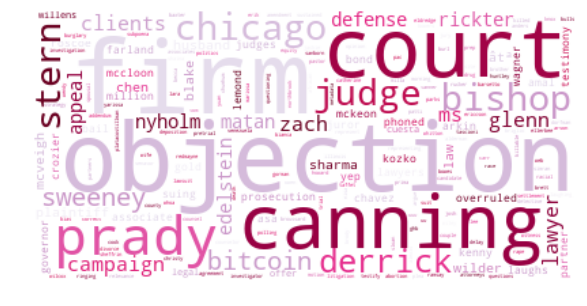

630___The_Nanny


<Figure size 1440x720 with 0 Axes>

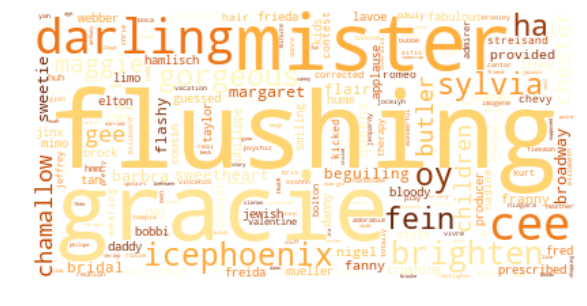

66___Ugly_Betty


<Figure size 1440x720 with 0 Axes>

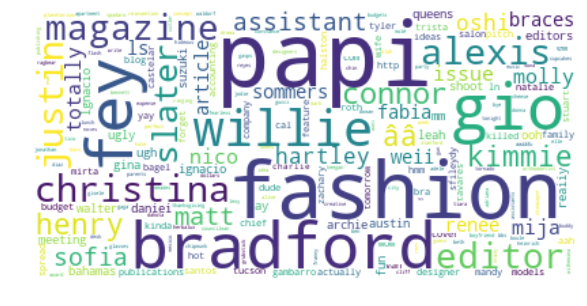

68___Black_Books


<Figure size 1440x720 with 0 Axes>

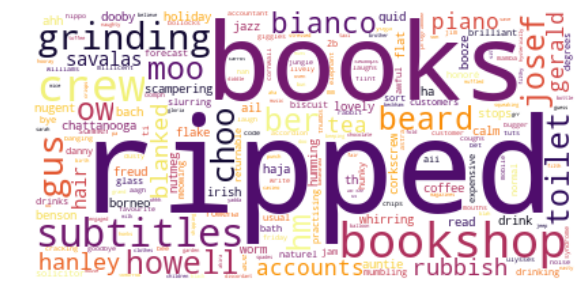

6___Dexter


<Figure size 1440x720 with 0 Axes>

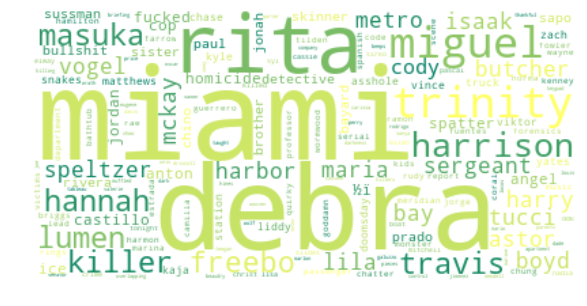

71___The_Wire


<Figure size 1440x720 with 0 Axes>

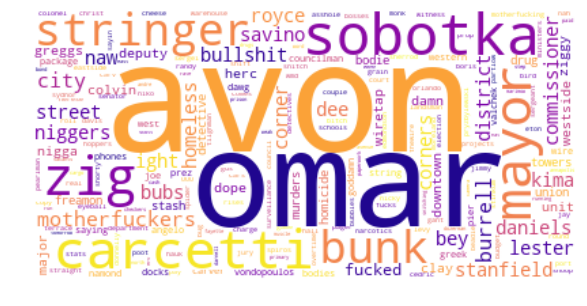

73___Rome


<Figure size 1440x720 with 0 Axes>

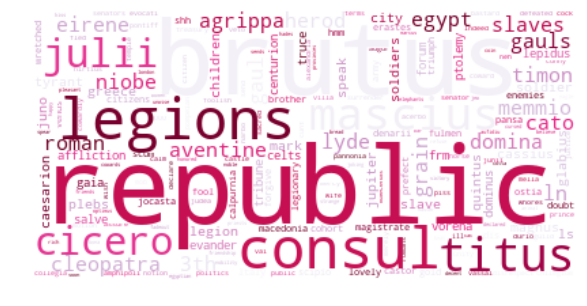

793___The_League_of_Gentlemen


<Figure size 1440x720 with 0 Axes>

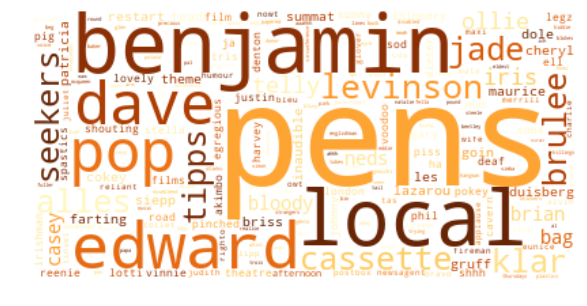

79___The_Office_(UK)


<Figure size 1440x720 with 0 Axes>

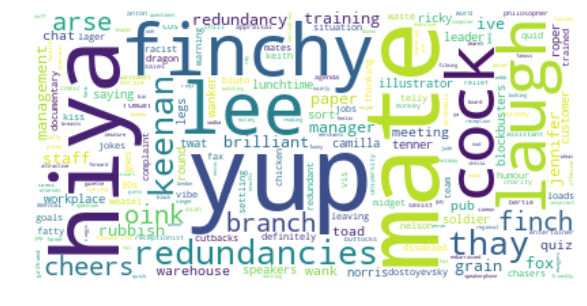

880___Pretty_Little_Liars


<Figure size 1440x720 with 0 Axes>

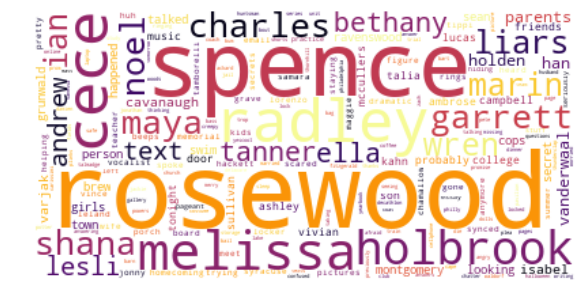

95___Sex___the_City


<Figure size 1440x720 with 0 Axes>

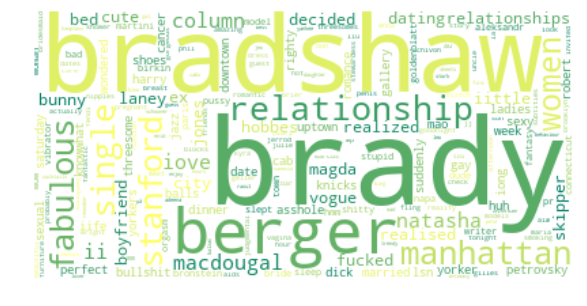

<Figure size 1440x720 with 0 Axes>

In [52]:
nb_series = len(d_name)
words = list(df.columns)
voc_len = len(words)
colormaps_list = ["viridis", "inferno", "summer", "plasma", "PuRd", "YlOrBr"]
cm_ind = 0

for i in range(nb_series):
    weights_vect = weights[i]
    dw = dict()
    for j in range(voc_len):
        dw[words[j]] = weights_vect[j]
    if cm_ind == len(colormaps_list):
        cm_ind = 0
    wordcloud = WordCloud(background_color="white", colormap=colormaps_list[cm_ind])
    cm_ind += 1
    wordcloud.generate_from_frequencies(frequencies=dw)
    plt.figure( figsize=(15,5) )
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    serie = d_name[i+1]
    print(serie)
    plt.show()
    plt.figure( figsize=(20,10) )
    wordcloud.to_file("wordclouds_weights/"+serie+".png")

Il y a encore des noms(ceux qui n'étaient pas dans les plus 20 + grands tf-idf).